#Aluno: Marcelo Brancalhão Gaspar

#Frequencia de corte 2629HZ 

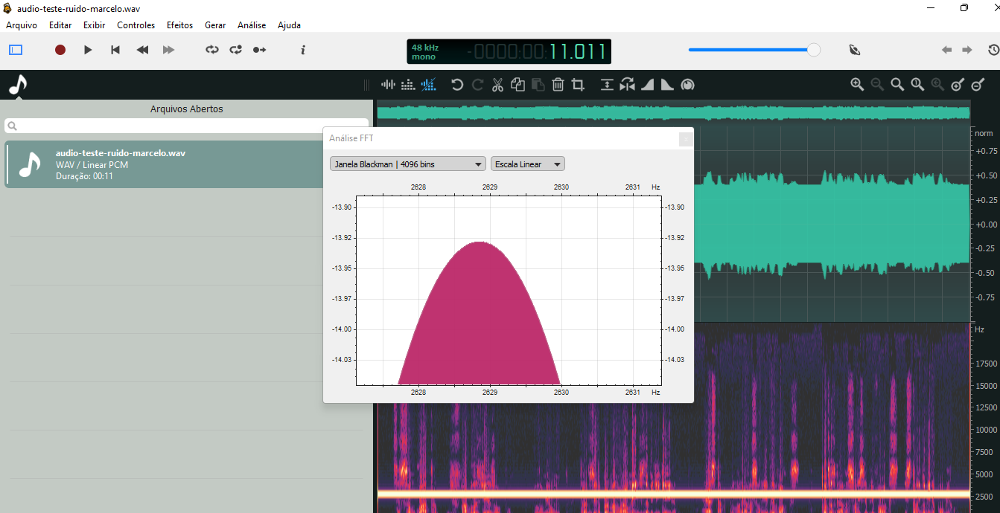

In [ ]:
from scipy.io import wavfile
from IPython.display import (Audio, display, clear_output)
import scipy.io.wavfile as wav
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import signal
%matplotlib inline

## Sinal Original

In [ ]:
fs, som = wavfile.read('audio-teste-ruido-marcelo.wav')
som = som/max(abs(som))
print(fs)
display(Audio(som, rate=fs))

48000


# Filtro FIR

FFT do audio com ruído


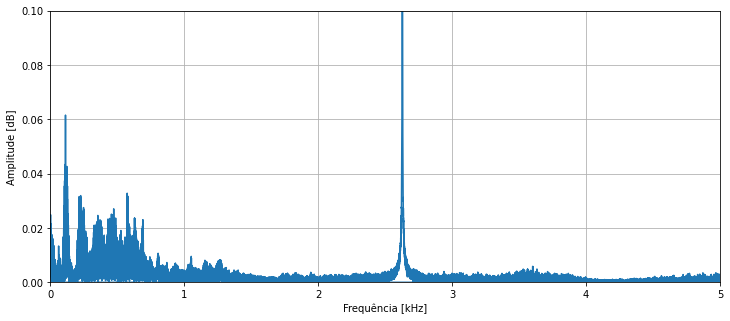

In [ ]:
fourier = np.fft.fft(som)
n = fourier.size
freqOri = np.fft.fftfreq(n, 1/fs)
plt.figure(figsize=(12, 5))
plt.xlim(0,5)
plt.ylim(0,0.1)
plt.grid()
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequência [kHz]')
plt.plot(freqOri/1000,abs(fourier)*2/fs)
print('FFT do audio com ruído')

Frequência do ruído = 2630Hz


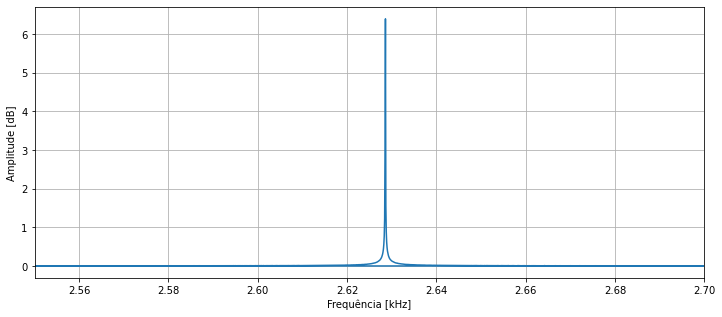

In [ ]:
plt.figure(figsize=(12, 5))
plt.xlim(2.55,2.7)
plt.grid()
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequência [kHz]')
plt.plot(freqOri/1000,abs(fourier)*2/fs)
print('Frequência do ruído = 2630Hz')

In [ ]:
coeficientes_filtro = pd.read_csv('coefiir.csv',sep=',',header=None)
b=coeficientes_filtro.values.ravel()
arr = b.reshape(b.size,1)
f = open("FIR_PB_2021-2.csv", "w")
for row in arr:
    np.savetxt(f, row)
f.close()

## Aplicando filtro rejeita faixa FIR janelado Blackman

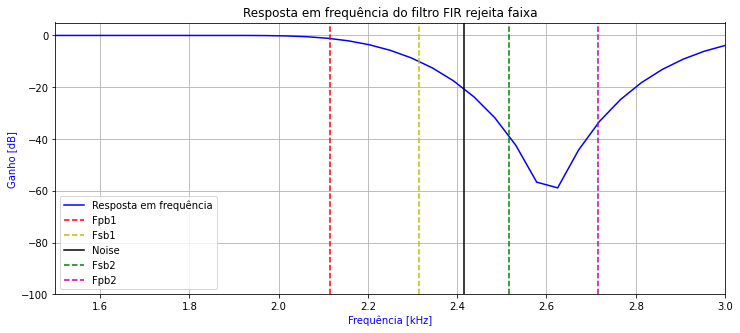

In [ ]:
w, h = signal.freqz(b,fs=fs)
plt.figure(figsize=(12,5))
plt.title('Resposta em frequência do filtro FIR rejeita faixa')
plt.plot(w/1000, 20 * np.log10(abs(h)), 'b',label='Resposta em frequência')
plt.ylabel('Ganho [dB]', color='b')
plt.xlabel('Frequência [kHz]', color='b')
plt.axvline(2.115,-100,1,c='r',ls='--',label='Fpb1')
plt.axvline(2.315,-100,1,c='y',ls='--',label='Fsb1')
plt.axvline(2.415,-100,1,c='k',ls='-',label='Noise')
plt.axvline(2.515,-100,1,c='g',ls='--',label='Fsb2')
plt.axvline(2.715,-100,1,c='m',ls='--',label='Fpb2')
plt.legend()
plt.ylim(-100,5)
plt.xlim(1.5,3)
plt.grid()
plt.show()


## Sinal Sweep para Validar o Filtro FIR

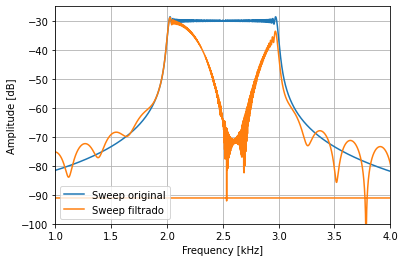

In [ ]:
t = np.linspace(0,1,fs)
sweep = signal.chirp(t,2000,1,3000)
fftSweep = np.fft.fft(sweep)
nSweep = fftSweep.size
freqSweep = np.fft.fftfreq(nSweep, 1/fs)
FIRFSweep = signal.lfilter(b,1,sweep)
FIRFSweep = FIRFSweep/max(abs(FIRFSweep))
plt.plot(freqSweep/1000,20 * np.log10(abs(fftSweep)*2/fs),label='Sweep original')
FFTFIRFSweep = np.fft.fft(FIRFSweep)
nFIRFSweep = FFTFIRFSweep.size
freqFIRFSweep=np.fft.fftfreq(nFIRFSweep,1/fs)
plt.plot(freqFIRFSweep/1000,20 * np.log10(abs(FFTFIRFSweep)*2/fs),label='Sweep filtrado')
plt.xlim(1,4)
plt.ylim(-100,-25)
plt.grid()
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [kHz]')
plt.legend()

## Audio Filtrado

In [ ]:
sinal_filtrado = signal.lfilter(b,1,som)
sinal_filtrado = sinal_filtrado/max(abs(sinal_filtrado))
wav.write('audio-sem-ruido-FIR.wav',fs,sinal_filtrado)
display(Audio(sinal_filtrado, rate=fs, autoplay=False))

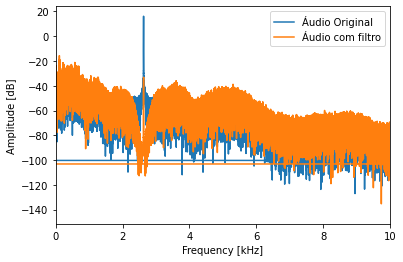

In [ ]:
plt.plot(freqOri/1000,20 * np.log10(abs(fourier)*2/fs), label = "Áudio Original")
filtrado_fourier = np.fft.fft(sinal_filtrado)
n_filtrado_fourier = filtrado_fourier.size
freq_fir = np.fft.fftfreq(n_filtrado_fourier, 1/fs)
plt.plot(freq_fir/1000,20 * np.log10(abs(filtrado_fourier)*2/fs), label = "Áudio com filtro")
plt.xlim(0,10)
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [kHz]')
plt.legend()

# Filtro IIR

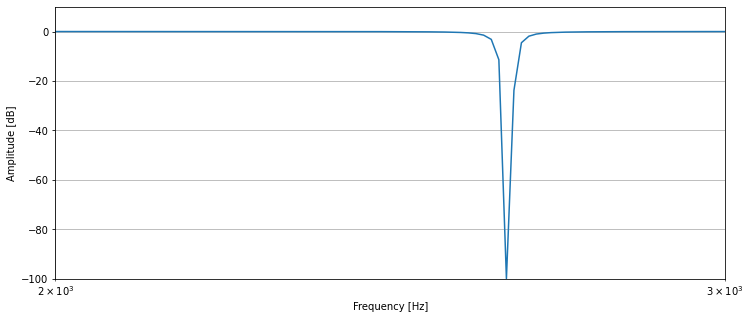

In [ ]:
sos = signal.iirfilter(17, [2620, 2640], rs=60, btype='bandstop',
                       analog=False, ftype='bessel', fs=48000,
                       output='sos')
w, h = signal.sosfreqz(sos, 2000, fs=48000)
fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(1, 1, 1)
ax.semilogx(w, 20 * np.log10(np.maximum(abs(h), 1e-5)))
#ax.set_title('Chebyshev Type II bandpass frequency response')
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('Amplitude [dB]')
ax.axis((2000, 3000, -100, 10))
ax.grid(which='both', axis='both')
plt.show()

In [ ]:
print('Coeficientes Filtro IIR - Bessel:\n', sos)

Coeficientes Filtro IIR - Bessel:
 [[ 0.98343534 -1.85146292  0.98343534  1.         -1.87994031  0.99712316]
 [ 1.         -1.88264835  1.          1.         -1.87983368  0.99716332]
 [ 1.         -1.88264835  1.          1.         -1.88012557  0.9971667 ]
 [ 1.         -1.88264835  1.          1.         -1.87981012  0.99728616]
 [ 1.         -1.88264835  1.          1.         -1.88038269  0.99729251]
 [ 1.         -1.88264835  1.          1.         -1.87987171  0.9974882 ]
 [ 1.         -1.88264835  1.          1.         -1.88070278  0.99749673]
 [ 1.         -1.88264835  1.          1.         -1.88001827  0.99776372]
 [ 1.         -1.88264835  1.          1.         -1.88107514  0.99777338]
 [ 1.         -1.88264835  1.          1.         -1.8802477   0.99810519]
 [ 1.         -1.88264835  1.          1.         -1.88148767  0.99811481]
 [ 1.         -1.88264835  1.          1.         -1.88055707  0.9985042 ]
 [ 1.         -1.88264835  1.          1.         -1.88192764  0.

## Sinal Sweep para Validar o FIltro IIR

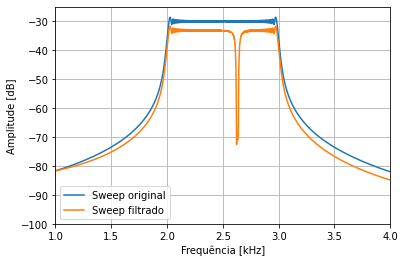

In [ ]:
filt_sweep = signal.sosfilt(sos,sweep)
filt_sweep = filt_sweep/max(abs(filt_sweep))
plt.plot(freqSweep/1000,20 * np.log10(abs(fftSweep)*2/fs),label='Sweep original')
fft_filt_sweep = np.fft.fft(filt_sweep)
n_filt_sweep = fft_filt_sweep.size
freq_filt_sweep=np.fft.fftfreq(n_filt_sweep,1/fs)
plt.plot(freq_filt_sweep/1000,20 * np.log10(abs(fft_filt_sweep)*2/fs),label='Sweep filtrado')
plt.xlim(1,4)
plt.ylim(-100,-25)
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequência [kHz]')
plt.grid()
plt.legend()

## Audio sem Ruido Filtro IIR

In [ ]:
sinal_filtrado2 = signal.lfilter(w,1,som)
sinal_filtrado2 = sinal_filtrado2/max(abs(sinal_filtrado2))
wav.write('audio-sem-ruido-IIR.wav',fs,sinal_filtrado)
display(Audio(sinal_filtrado, rate=fs, autoplay=False))

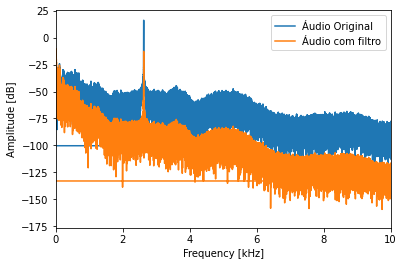

In [ ]:
plt.plot(freqOri/1000,20 * np.log10(abs(fourier)*2/fs), label = "Áudio Original")
IIRfourier = np.fft.fft(sinal_filtrado2)
nIIR = IIRfourier.size
freqIIR = np.fft.fftfreq(nIIR, 1/fs)
plt.plot(freqIIR/1000,20 * np.log10(abs(IIRfourier)*2/fs), label = "Áudio com filtro")
plt.xlim(0,10)
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [kHz]')
plt.legend()

# Filtro Notch

In [ ]:
f0 = 2629 #frequencia do espurio
alfa = 8 #ajustado conforme projeto
p = 0.9  #cumprir o requisito de p
w = 2*np.pi*f0/fs # fs=48kHz

a = np.array([1+alfa, -2*(alfa+p)*np.cos(w), (p**2+alfa)])
b = np.array([1+alfa, -2*(1+alfa)*np.cos(w), 1+alfa])

b = b/a[0]
a = a/a[0]

print('Coeficientes do filtro Notch: \na = ',a,'\nb = ',b)

Coeficientes do filtro Notch: 
a =  [ 1.         -1.8618158   0.97888889] 
b =  [ 1.         -1.88273508  1.        ]


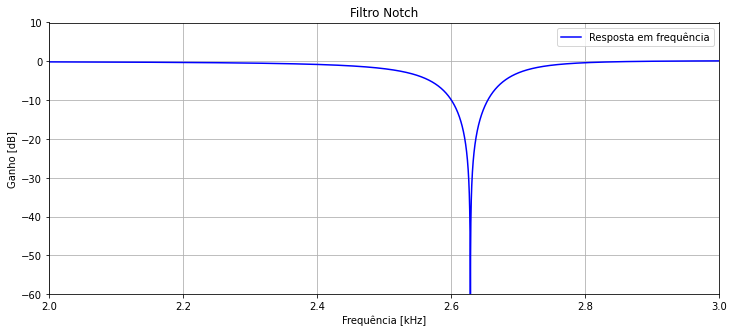

In [ ]:
w, h = signal.freqz(b,a,500000)
plt.figure(figsize=(12,5))
plt.title('Filtro Notch')
plt.plot(fs*w/(2*np.pi*1000), 20 * np.log10(abs(h)), 'b',label='Resposta em frequência')
plt.ylabel('Ganho [dB]')
plt.xlabel('Frequência [kHz]')
plt.legend()
plt.ylim(-60,10)
plt.xlim(2,3)
plt.grid()
plt.show()

## Sweep Para Validar o Filtro Notch

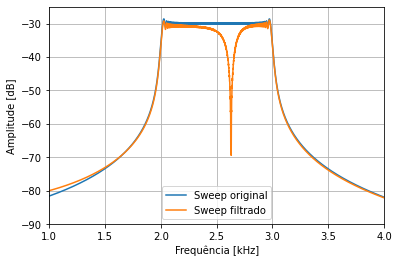

In [ ]:
notchSweep = signal.lfilter(b,a,sweep)
notchSweep = notchSweep/max(abs(notchSweep))
plt.plot(freqSweep/1000,20 * np.log10(abs(fftSweep)*2/fs),label='Sweep original')
FFTnotchSweep = np.fft.fft(notchSweep)
nnotchSweep = FFTnotchSweep.size
freqnotchSweep=np.fft.fftfreq(nnotchSweep,1/fs)
plt.plot(freqnotchSweep/1000,20 * np.log10(abs(FFTnotchSweep)*2/fs),label='Sweep filtrado')
plt.xlim(1,4)
plt.ylim(-90,-25)
plt.grid()
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequência [kHz]')
plt.legend()
plt.show()

## Audio com Filtro Notch

In [ ]:
sinal_notch_filtrado= signal.lfilter(b,a,som)
sinal_notch_filtrado = sinal_notch_filtrado/max(abs(sinal_notch_filtrado))
wav.write('audio-sem-espurio-Notch.wav',fs,sinal_notch_filtrado)
display(Audio(sinal_notch_filtrado, rate=fs, autoplay=False))

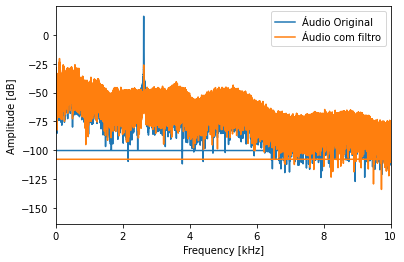

In [ ]:
plt.plot(freqOri/1000,20 * np.log10(abs(fourier)*2/fs), label = "Áudio Original")
notchfourier = np.fft.fft(sinal_notch_filtrado)
n_notch = notchfourier.size
freq_notch = np.fft.fftfreq(n_notch, 1/fs)
plt.plot(freq_notch/1000,20 * np.log10(abs(notchfourier)*2/fs), label = "Áudio com filtro")
plt.xlim(0,10)
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [kHz]')
plt.legend()

# Placa Wolfson-Pi

## Filtro FIR Float 32

In [ ]:
fsc,audiofirf = wavfile.read('firfloatesquerdo.wav')
audiofirf = audiofirf/max(abs(audiofirf))
print("fs =",fsc)
print('Áudio Filtrado float 32:')
display(Audio(audiofirf, rate=fsc, autoplay=False))


fs = 48000
Áudio Filtrado float 32:


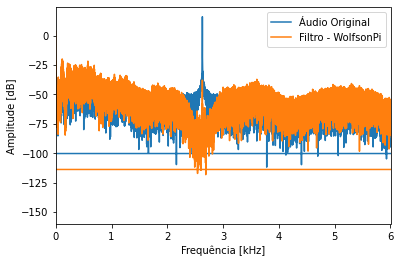

In [ ]:
plt.plot(freqOri/1000,20 * np.log10(abs(fourier)*2/fs), label = "Áudio Original")
wolfFourier = np.fft.fft(audiofirf)
n = wolfFourier.size
freqwolf = np.fft.fftfreq(n, 1/fs)
plt.plot(freqwolf/1000,20 * np.log10(abs(wolfFourier)*2/fs), label = "Filtro - WolfsonPi")
plt.xlim(0,6)
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequência [kHz]')
plt.legend()

## Filtro FIR Q15

In [ ]:
[fs,audiofir] = wav.read('firfixoesquerdo.wav')
audiofir = audiofir/max(abs(audiofir))
print("fs =",fs)
print('Áudio Filtrado Q15:')
display(Audio(audiofir, rate=fs, autoplay=False))

fs = 48000
Áudio Filtrado Q15:


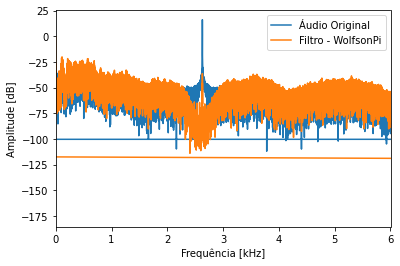

In [ ]:
plt.plot(freqOri/1000,20 * np.log10(abs(fourier)*2/fs), label = "Áudio Original")
wolfFourier = np.fft.fft(audiofir)
n = wolfFourier.size
freqwolf = np.fft.fftfreq(n, 1/fs)
plt.plot(freqwolf/1000,20 * np.log10(abs(wolfFourier)*2/fs), label = "Filtro - WolfsonPi")
plt.xlim(0,6)
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequência [kHz]')
plt.legend()

## Comparação dos Audios Filtro FIR

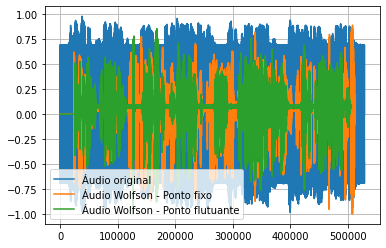

In [ ]:
plt.plot(som,label="Áudio original")
plt.plot(audiofir,label="Áudio Wolfson - Ponto fixo")
plt.plot(audiofirf,label="Áudio Wolfson - Ponto flutuante")
plt.legend()
plt.grid()

# Filtro IIR

In [ ]:
[fsc,audioiir] = wav.read('iiresquerdo.wav')
audioiir = audiofirf/max(abs(audioiir))
print("fs =",fsc)
display(Audio(audioiir, rate=fsc, autoplay=False))

fs = 48000


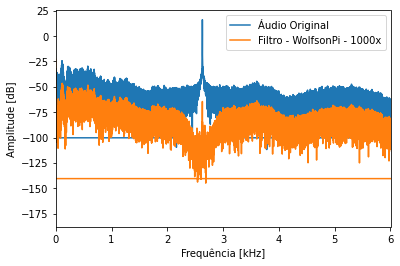

In [ ]:
plt.plot(freqOri/1000,20 * np.log10(abs(fourier)*2/fs), label = "Áudio Original")
wolfFourier = np.fft.fft(audioiir)
n = wolfFourier.size
freqwolf = np.fft.fftfreq(n, 1/fs)
plt.plot(freqwolf/1000,20 * np.log10(abs(wolfFourier)*2000/fs), label = "Filtro - WolfsonPi - 1000x")
plt.xlim(0,6)
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequência [kHz]')
plt.legend()

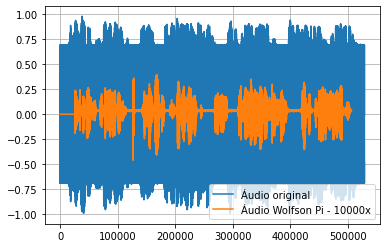

In [ ]:
plt.plot(som,label="Áudio original")
plt.plot(10000*audioiir,label="Áudio Wolfson Pi - 10000x")
plt.legend()
plt.grid()

## Filtro Notch

### Ao implementar o filtro notch na placa não foi possível captar o sinal filtrado pois o ruido das entradas estava sobrepondo o audio filtrado, varias mudanças de ganho foram utilizadas, porém nenehum resultado foi satisfatório.

# Conclusões

### Todos os filtros foram capazes de suprimir o ruído presente no áudio original. Nota-se que o filtro Notch ele é mais preciso, atenuando menos frequências, desta forma quando bem projetado é possível atenuar apenas a frequência do tom espúrio. O filtro IIR e Notch possuem ordens menores do que o FIR, facilitando a implementação em hardwares